# Revised Lab1 Homework

### Student Information
Name: 李佾昀 Lee, I-Yun

Student ID: 107034013

GitHub ID: tool0717

---

### Instructions

1. First: do the **take home** exercises in the [DM2021-Lab1-master Repo](https://github.com/fhcalderon87/DM2021-Lab1-master). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2021-Lab1-master Repo](https://github.com/fhcalderon87/DM2021-Lab1-master) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://archive.ics.uci.edu/ml/datasets/Sentiment+Labelled+Sentences#). The dataset contains a `sentence` and `score` label. Read the specificiations of the dataset for details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Sciki-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be habdled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy :'(, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/fhcalderon87/DM2021-Lab1-master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (Nov. 4th 11:59 pm, Thursday)__. 

---
# Part 1 : Take Home

In [3]:
%load_ext autoreload
%autoreload 2 

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
### Begin Assignment Here

categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']
from sklearn.datasets import fetch_20newsgroups

twenty_train = fetch_20newsgroups(subset='train', categories=categories, \
                                  shuffle=True, random_state=42)
import pandas as pd
import helpers.data_mining_helpers as dmh

X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])
X['category'] = twenty_train.target
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

###  Exercise 2 (take home):
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [5]:
#Answer here
X[X['category']==1][["text"]][:5]

,text
0,From: sd345@city.ac.uk (Michael Collier) Subje...
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...
11,From: amjad@eng.umd.edu (Amjad A Soomro) Subje...
14,From: sloan@cis.uab.edu (Kenneth Sloan) Subjec...
15,From: Mike_Peredo@mindlink.bc.ca (Mike Peredo)...


### Exercise 5 (take home)
There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

In [6]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [7]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

In [8]:
# Answer here
for i in NA_df['missing_example']:
    print(type(i))

<class 'float'>
<class 'float'>
<class 'str'>
<class 'str'>
<class 'NoneType'>
<class 'str'>


#### illustration
Data such as 'NaN', 'None', '' were 'str' type, while the function ```.isnull()``` is not designed to distingiush contents of strings. That is, the function can't tell if 'None' and other strings are actually null data or only general content that happened to be the word 'None'.

### Exercise 6 (take home):

In [9]:
X[0:5]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian


In [10]:
X_sample = X.sample(n=1000) #random state
X_sample[0:5]

,text,category,category_name
1222,From: rubery@saturn.aitc.rest.tasc.com. (Dan R...,1,comp.graphics
2212,From: nyeda@cnsvax.uwec.edu (David Nye) Subjec...,2,sci.med
1101,From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...,0,alt.atheism
453,From: shellgate!llo@uu4.psi.com (Larry L. Over...,3,soc.religion.christian
653,From: daniel@lclark.edu (Daniel Snodgrass) Sub...,1,comp.graphics


In [11]:
X[0:5]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian


Notice any changes to the `X` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

#### Answer
Through observating the outputs above, we can simply tell that the ```.sample()``` process does not influence the original dataset ```X```.
There's no change compared to the previous state of ```X```.

### Exercise 8 (take home):
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

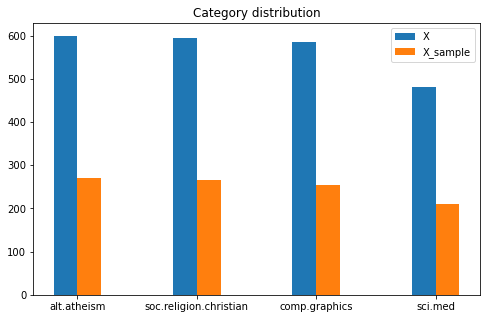

In [12]:
import matplotlib.pyplot as plt
blue_bar = X.category_name.value_counts().values.tolist()
orange_bar = X_sample.category_name.value_counts().values.tolist()
# print(blue_bar)
# print(orange_bar)
labels = categories
indent = np.arange(len(labels))
plt.figure(figsize=(8,5))
width = 0.2

plt.bar(indent, blue_bar, width, label='X')
plt.bar(indent+width, orange_bar, width, label='X_sample')
plt.title('Category distribution')
plt.xticks(indent+width/2, labels)
plt.style.use('default')
plt.legend(loc='best')
plt.show()

### Exercise 10 (take home):
We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [13]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text)

#### Answer

In [14]:
for i in range(1000):
    if X_counts[4, i] == 1:
        print(str(i)+": "+count_vect.get_feature_names()[i])

0: 00
37: 01
587: 14
677: 15


### Exercise 11 (take home):
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with frequency of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

#### Answer

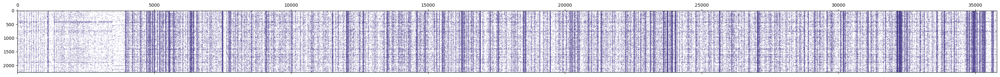

In [15]:
import seaborn as sns
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names()[0:]]
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:]]
plot_z = X_counts[0:, 0:].toarray()
plt.figure(figsize=(40,25))
plt.spy(plot_z, markersize=0.1, color='Darkslateblue')

###  Exercise 12 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

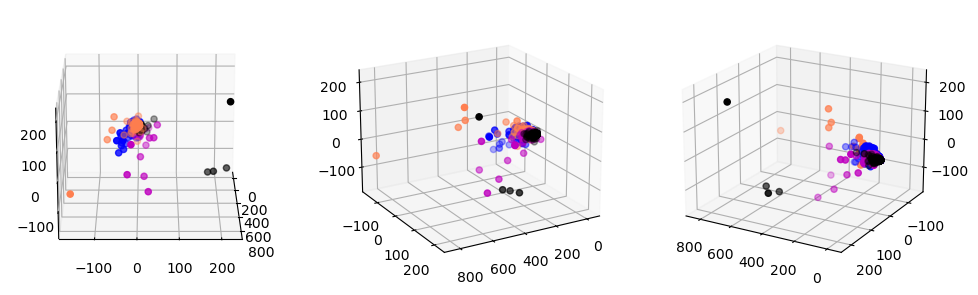

In [16]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

X_reduced = PCA(n_components = 3).fit_transform(X_counts.toarray())

fig = plt.figure(figsize=(12, 10)) 
# ax = fig.add_subplot(1,1,1, projection='3d')
col = ['coral', 'blue', 'black', 'm']
for i in range(3):
    ax = fig.add_subplot(1,3,i+1, projection='3d')
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        zs = X_reduced[X['category_name'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c)
    ax.view_init(elev=20, azim=i*60)

### Exercise 13 (take home):
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [18]:
term_frequencies = []
for j in range(0,X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:,j].toarray()))
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]    

#### Answer
From the table above, we can observe that most of the words only appeared once. Hence, I choose to remove those words, and plot a graph with rest of them, in order to emphasize those that mean more, and save energy on analyzing.

In [28]:
import plotly.express as px
fig = px.bar(y=term_frequencies[:],x=count_vect.get_feature_names()[:],width=2000, height=400,labels={'x':'feature names','y':'term frequencies'})
fig.show()

### Exercise 14 (take home):
The chart above contains all the vocabulary, and it's computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 

In [29]:
data = {'feature_names':count_vect.get_feature_names(),'term_frequencies':term_frequencies}
df_freq = pd.DataFrame(data)
df_freq

,feature_names,term_frequencies
0,00,134
1,000,92
2,0000,1
3,0000001200,2
4,000005102000,1
...,...,...
35783,zyxel,2
35784,zz,1
35785,zzz,1
35786,ªl,1


#### Answer

In [30]:
df_drop1 = df_freq[df_freq.term_frequencies != 1]
df_drop1
import plotly.express as px
fig = px.bar(x=df_drop1.feature_names[:],y=df_drop1.term_frequencies[:],width=800, height=400,labels={'x':'feature names','y':'term frequencies'})
fig.show()

### Exercise 15 (take home):
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

#### Answer

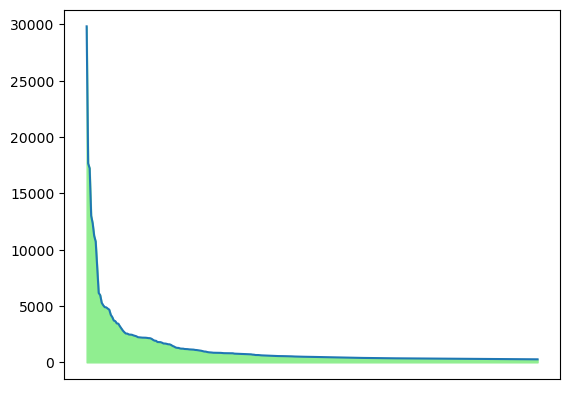

In [31]:
data = {'feature_names':count_vect.get_feature_names(),'term_frequencies':term_frequencies}
df_freq = pd.DataFrame(data)
df_freq_sorted = df_freq.sort_values(by=['term_frequencies'],ascending = False)

plt.plot(df_freq_sorted.feature_names[:300],df_freq_sorted.term_frequencies[:300])

plt.fill_between(df_freq_sorted.feature_names[:300],df_freq_sorted.term_frequencies[:300], color = 'lightgreen')
plt.xticks([])
plt.show()

### Exercise 16 (take home):
Try to generate the binarization using the `category_name` column instead. Does it work?

In [32]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()

#### Answer

In [33]:
mlb.fit(X.category_name)
X['bin_category'] = mlb.transform(X['category_name']).tolist()
X[0:9]

,text,category,category_name,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[0, 0, 1, 0]"


---
# Part 2 : New Dataset

## 1. Data Preparation and Transformation

In [358]:
import os

folder = './sentiment labelled sentences/'
files = [folder + 'amazon_cells_labelled.txt', folder + 'imdb_labelled.txt', folder + 'yelp_labelled.txt']

data = []
for file in files:
    with open(file, 'r', encoding = 'utf-8') as f:
        for line in f.readlines():
            temp = line.split('\n')
            data.append(temp[0].split('\t'))
            
df = pd.DataFrame(data, columns = ['sentence', 'score'])
#df

In [359]:
df['company_name'] = ''
df.company_name[:1000] = 'amazon'
df.company_name[1000:2000] = 'imdb'
df.company_name[2000:3000] = 'yelp'

In [360]:
df = df.sample(n = len(df))

In [361]:
df[:5]

,sentence,score,company_name
2494,Their daily specials are always a hit with my ...,1,yelp
2182,I dressed up to be treated so rudely!,0,yelp
2210,If that bug never showed up I would have given...,0,yelp
732,T-Mobile has the best customer service anywhere.,1,amazon
2512,By far the BEST cheesecurds we have ever had!,1,yelp


In [362]:
df.sentence

2494    Their daily specials are always a hit with my ...
2182                I dressed up to be treated so rudely!
2210    If that bug never showed up I would have given...
732      T-Mobile has the best customer service anywhere.
2512        By far the BEST cheesecurds we have ever had!
                              ...                        
2886                      The service was extremely slow.
811                   #1 It Works - #2 It is Comfortable.
1584             Generally; it just lacked imagination.  
1803    The acting from all involved and that includes...
1871                 The script is horrendously stupid.  
Name: sentence, Length: 3000, dtype: object

In [363]:
len(df)

3000

In [364]:
companies = ['amazon','imdb','yelp']
companies

['amazon', 'imdb', 'yelp']

In [365]:
df['company'] = ''
df.company = df.company_name.apply(lambda x: companies.index(x))
df

,sentence,score,company_name,company
2494,Their daily specials are always a hit with my ...,1,yelp,2
2182,I dressed up to be treated so rudely!,0,yelp,2
2210,If that bug never showed up I would have given...,0,yelp,2
732,T-Mobile has the best customer service anywhere.,1,amazon,0
2512,By far the BEST cheesecurds we have ever had!,1,yelp,2
...,...,...,...,...
2886,The service was extremely slow.,0,yelp,2
811,#1 It Works - #2 It is Comfortable.,1,amazon,0
1584,Generally; it just lacked imagination.,0,imdb,1
1803,The acting from all involved and that includes...,0,imdb,1


In [366]:
#a simple query
df[0:5][["score", "company_name"]]

,score,company_name
2494,1,yelp
2182,0,yelp
2210,0,yelp
732,1,amazon
2512,1,yelp


In [367]:
#query the last 5 records
df[-5:]

,sentence,score,company_name,company
2886,The service was extremely slow.,0,yelp,2
811,#1 It Works - #2 It is Comfortable.,1,amazon,0
1584,Generally; it just lacked imagination.,0,imdb,1
1803,The acting from all involved and that includes...,0,imdb,1
1871,The script is horrendously stupid.,0,imdb,1


In [368]:
# using loc (by position)
df.iloc[::5, 0:2][0:5]

,sentence,score
2494,Their daily specials are always a hit with my ...,1
1458,"This gets a 1 out of 10, simply because there'...",0
1504,Cinematography noteworthy including fine views...,1
1701,How awful she is!,0
2869,The feel of the dining room was more college c...,0


In [369]:
# using loc (by label)
df.loc[::5, 'sentence'][0:5]

2494    Their daily specials are always a hit with my ...
1458    This gets a 1 out of 10, simply because there'...
1504    Cinematography noteworthy including fine views...
1701                                  How awful she is!  
2869    The feel of the dining room was more college c...
Name: sentence, dtype: object

In [370]:
# standard query (Cannot simultaneously select rows and columns)
df[::5][0:5]

,sentence,score,company_name,company
2494,Their daily specials are always a hit with my ...,1,yelp,2
1458,"This gets a 1 out of 10, simply because there'...",0,imdb,1
1504,Cinematography noteworthy including fine views...,1,imdb,1
1701,How awful she is!,0,imdb,1
2869,The feel of the dining room was more college c...,0,yelp,2


### Exercise 2
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [371]:
#Answer here
df[df['company']==1][["sentence"]][:5]

,sentence
1458,"This gets a 1 out of 10, simply because there'..."
1962,"Their on-screen chemistry, critical to the ent..."
1720,That's how I'd describe this painfully dreary ...
1504,Cinematography noteworthy including fine views...
1031,Waste your money on this game.


### Exercise 3
Try to fecth records belonging to the ```imdb``` category, and query every 10th record. Only show the first 5 records.

In [372]:
# Answer here
df.loc[df['company_name']=="imdb"][::10][:5]

,sentence,score,company_name,company
1458,"This gets a 1 out of 10, simply because there'...",0,imdb,1
1492,But this movie really got to me.,1,imdb,1
1473,The awful dialogue and hopeless overacting by ...,0,imdb,1
1958,I enjoyed it.,1,imdb,1
1400,A good commentary of today's love and undoubte...,1,imdb,1


## 2. Data Mining using Pandas

In [373]:
df.isnull()

,sentence,score,company_name,company
2494,False,False,False,False
2182,False,False,False,False
2210,False,False,False,False
732,False,False,False,False
2512,False,False,False,False
...,...,...,...,...
2886,False,False,False,False
811,False,False,False,False
1584,False,False,False,False
1803,False,False,False,False


In [374]:
df.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentence,score,company_name,company
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0,0


### Exercise 4
Let's try something different. Instead of calculating missing values by column let's try to calculate the missing values in every record instead of every column.  
$Hint$ : `axis` parameter. Check the documentation for more information.

In [375]:
# Answer here
df.isnull().apply(lambda x: dmh.check_missing_values(x), axis=1)

2494    (The amoung of missing records is: , 0)
2182    (The amoung of missing records is: , 0)
2210    (The amoung of missing records is: , 0)
732     (The amoung of missing records is: , 0)
2512    (The amoung of missing records is: , 0)
                         ...                   
2886    (The amoung of missing records is: , 0)
811     (The amoung of missing records is: , 0)
1584    (The amoung of missing records is: , 0)
1803    (The amoung of missing records is: , 0)
1871    (The amoung of missing records is: , 0)
Length: 3000, dtype: object

In [376]:
dummy_series = pd.Series(["dummy_record", 1], index=["sentence", "score"])

dummy_series

sentence    dummy_record
score                  1
dtype: object

In [377]:
result_with_series = df.append(dummy_series, ignore_index=True)
print(len(result_with_series))

3001


In [378]:
result_with_series.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentence,score,company_name,company
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,1,1


In [379]:
# dummy record as dictionary format
dummy_dict = [{'sentence': 'dummy_record',
               'company': 1
              }]
df = df.append(dummy_dict, ignore_index=True)
print(len(df))

3001


In [380]:
df.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentence,score,company_name,company
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,1,1,0


In [381]:
df.dropna(inplace=True)
df.isnull().apply(lambda x: dmh.check_missing_values(x))
print(len(df))

3000


### Exercise5

In [382]:
sum(df.sentence.duplicated())

17

In [383]:
df.sentence.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2995    False
2996    False
2997    False
2998    False
2999    False
Name: sentence, Length: 3000, dtype: bool

In [384]:
df.drop_duplicates(keep = 'first', inplace = True)

In [385]:
len(df)

2983

## 3.Data Preprocessing

### Sampling

In [386]:
df_sample = df.sample(n=1000) #random state
print(len(df_sample))

1000


In [387]:
df_sample[0:5]

,sentence,score,company_name,company
1344,I would give this television series a 10 plus ...,1,imdb,1
1325,We'll never go again.,0,yelp,2
511,The best place to go for a tasty bowl of Pho!,1,yelp,2
150,"When I placed my treo into the case, not only ...",0,amazon,0
1340,This is a GREAT place to eat!,1,yelp,2


### ```Exercise 6```session is exactly the same as above. Hence, pass here.

### Matplotlib

In [388]:
import matplotlib.pyplot as plt
%matplotlib inline

In [389]:
companies

['amazon', 'imdb', 'yelp']

imdb      997
yelp      996
amazon    990
Name: company_name, dtype: int64


<AxesSubplot:title={'center':'Company distribution'}>

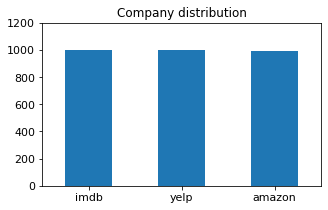

In [390]:
#showing the number of data for each company
print(df.company_name.value_counts())

# plot barchart for df_sample
df.company_name.value_counts().plot(kind = 'bar',
                                    title = 'Company distribution',
                                    ylim = [0, 1200],        
                                    rot = 0, fontsize = 11, figsize = (5,3))

### Exercise 7
Notice that for the `ylim` parameters we hardcoded the maximum value for y. Is it possible to automate this instead of hard-coding it? How would you go about doing that? (Hint: look at code above for clues)

yelp      346
amazon    331
imdb      323
Name: company_name, dtype: int64


<AxesSubplot:title={'center':'Company distribution'}>

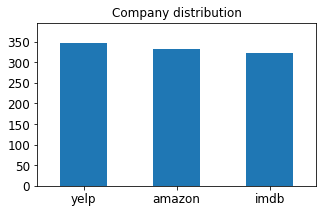

In [391]:
upper_bound = max(df_sample.company_name.value_counts()) + 50

print(df_sample.company_name.value_counts())

# plot barchart for X_sample
df_sample.company_name.value_counts().plot(kind = 'bar',
                                           title = 'Company distribution',
                                           ylim = [0, upper_bound], 
                                           rot = 0, fontsize = 12, figsize = (5,3))


### Exercise 8
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

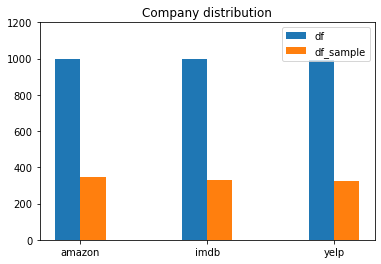

In [392]:
import numpy as np
blue_bar = df.company_name.value_counts().values.tolist()
orange_bar = df_sample.company_name.value_counts().values.tolist()
# print(blue_bar)
# print(orange_bar)
labels = companies
indent = np.arange(len(labels))
plt.figure(figsize=(6, 4))
width = 0.2

plt.bar(indent, blue_bar, width, label='df')
plt.bar(indent+width, orange_bar, width, label='df_sample')
plt.title('Company distribution')
plt.xticks(indent+width/2, labels)
plt.ylim([0,1200])
plt.style.use('default')
plt.legend(loc=None)
plt.show()

### Feature Creation

In [393]:
import nltk
df['unigrams'] = df['sentence'].apply(lambda x: dmh.tokenize_text(x))

In [394]:
df[0:4]

,sentence,score,company_name,company,unigrams
0,Their daily specials are always a hit with my ...,1,yelp,2,"[Their, daily, specials, are, always, a, hit, ..."
1,I dressed up to be treated so rudely!,0,yelp,2,"[I, dressed, up, to, be, treated, so, rudely, !]"
2,If that bug never showed up I would have given...,0,yelp,2,"[If, that, bug, never, showed, up, I, would, h..."
3,T-Mobile has the best customer service anywhere.,1,amazon,0,"[T-Mobile, has, the, best, customer, service, ..."


In [395]:
df[0:4]["unigrams"]

0    [Their, daily, specials, are, always, a, hit, ...
1     [I, dressed, up, to, be, treated, so, rudely, !]
2    [If, that, bug, never, showed, up, I, would, h...
3    [T-Mobile, has, the, best, customer, service, ...
Name: unigrams, dtype: object

### Feature Subset Selection

In [396]:
from sklearn.feature_extraction.text import CountVectorizer

df_count_vect = CountVectorizer()
df_counts = df_count_vect.fit_transform(df.sentence)

### Exercise 9
Let's analyze the first record of our X dataframe with the new analyzer we have just built. Go ahead try it!

In [397]:
analyze = df_count_vect.build_analyzer()
analyze(df.iloc[0]['sentence'])

['their', 'daily', 'specials', 'are', 'always', 'hit', 'with', 'my', 'group']

---

In [398]:
df_counts.shape

(2983, 5155)

In [399]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis
df_count_vect.get_feature_names()[0:10]

['00', '10', '100', '11', '12', '13', '15', '15g', '15pm', '17']

In [400]:
df[5:10]

,sentence,score,company_name,company,unigrams
5,"This gets a 1 out of 10, simply because there'...",0,imdb,1,"[This, gets, a, 1, out, of, 10, ,, simply, bec..."
6,These are the nicest restaurant owners I've ev...,1,yelp,2,"[These, are, the, nicest, restaurant, owners, ..."
7,"Their on-screen chemistry, critical to the ent...",1,imdb,1,"[Their, on-screen, chemistry, ,, critical, to,..."
8,The voice recognition thru the handset is exce...,1,amazon,0,"[The, voice, recognition, thru, the, handset, ..."
9,That's how I'd describe this painfully dreary ...,0,imdb,1,"[That, 's, how, I, 'd, describe, this, painful..."


In [401]:
df_counts[215:216,0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=int64)

### Exercise 10
Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [402]:
for i in range(1000):
    if df_counts[215, i] == 1:
        print(str(i)+": "+ df_count_vect.get_feature_names()[i])

197: am
738: cell
768: charger


## 4. Visualization

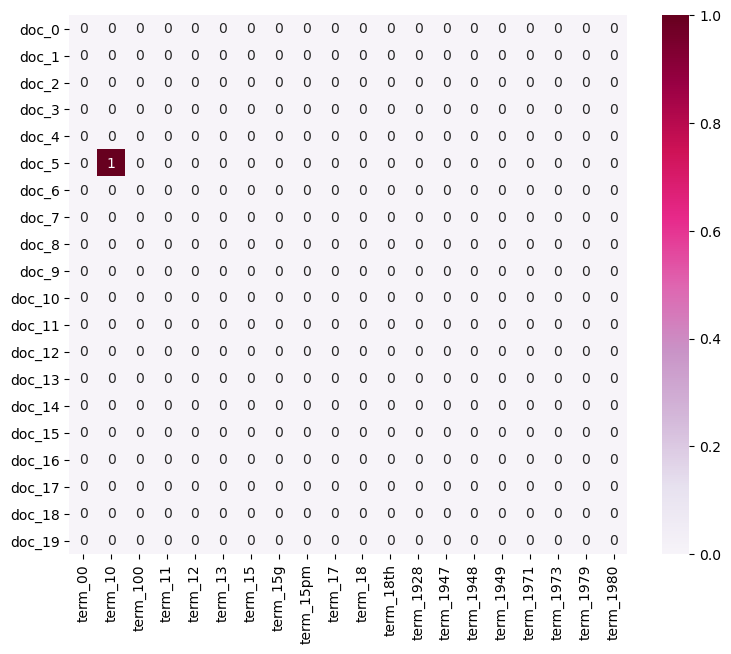

In [403]:
plot_dfx = ["term_"+str(i) for i in df_count_vect.get_feature_names()[0:20]]

# obtain document index
plot_dfy = ["doc_"+ str(i) for i in list(df.index)[0:20]]
plot_dfz = df_counts[0:20, 0:20].toarray()

import seaborn as sns

df_todraw = pd.DataFrame(plot_dfz, columns = plot_dfx, index = plot_dfy)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

### Exercise 11
 As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? 
 
Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

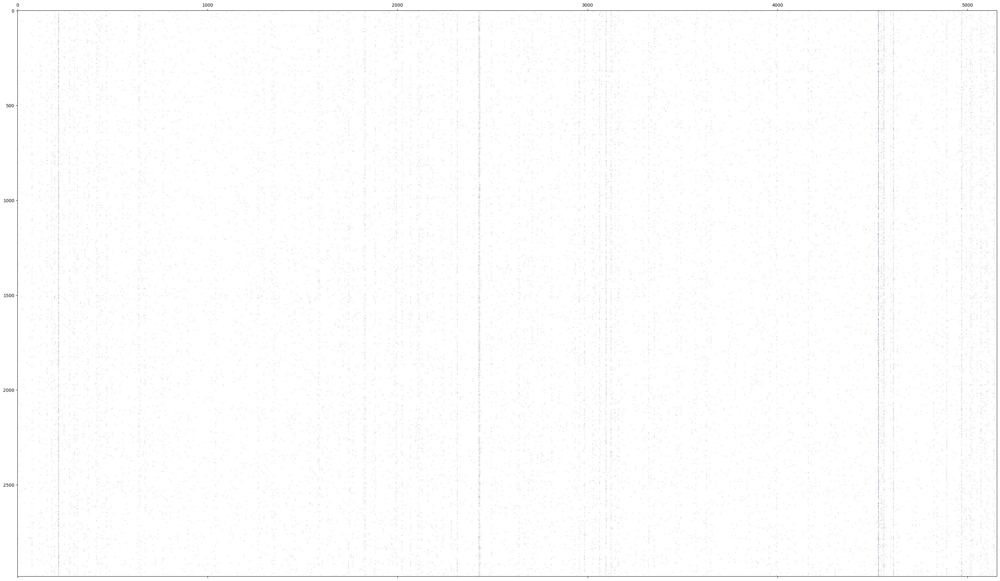

In [404]:
import seaborn as sns
plot_dfx = ["term_"+str(i) for i in df_count_vect.get_feature_names()[0:]]
plot_dfy = ["doc_"+ str(i) for i in list(df.index)[0:]]
plot_dfz = df_counts[0:, 0:].toarray()
plt.figure(figsize=(40,25))
plt.spy(plot_dfz, markersize=0.1, color='Darkslateblue')

### Dimensionality Reduction

In [405]:
from sklearn.decomposition import PCA
df_reduced = PCA(n_components = 2).fit_transform(df_counts.toarray())
df_reduced.shape

(2983, 2)

In [406]:
companies

['amazon', 'imdb', 'yelp']

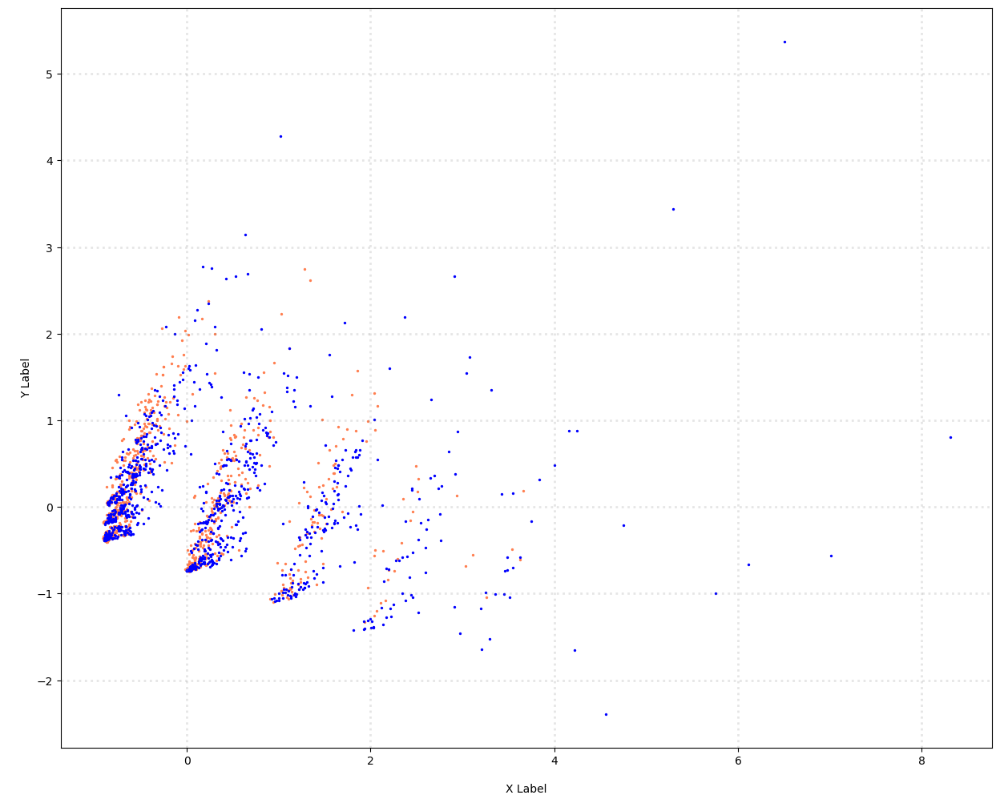

In [407]:
col = ['coral', 'blue']

# plot
fig = plt.figure(figsize = (15,12))
ax = fig.subplots()

for c, comp in zip(col, companies):
    xs = df_reduced[df['company_name'] == comp].T[0]
    ys = df_reduced[df['company_name'] == comp].T[1]
   
    ax.scatter(xs, ys, c = c, marker='o',s=2)

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')

plt.show()

### Exercise 12
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

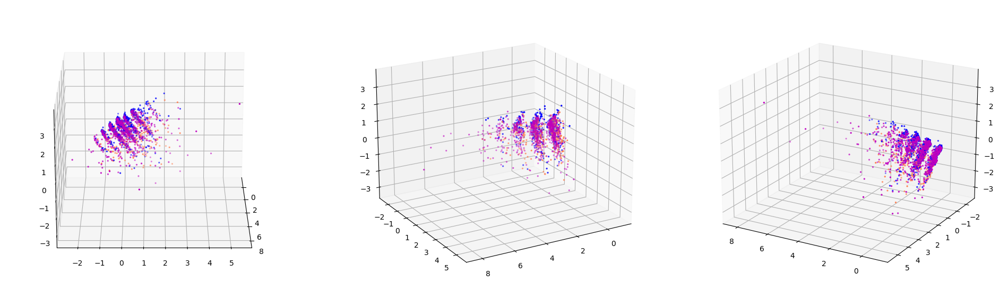

In [408]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

df_reduced = PCA(n_components = 3).fit_transform(df_counts.toarray())

fig = plt.figure(figsize=(24, 20)) 

col = ['coral', 'm', 'blue']
for i in range(3):
    ax = fig.add_subplot(1,3,i+1, projection='3d')
    for c, comp in zip(col, companies):
        xs = df_reduced[df['company_name'] == comp].T[0]
        ys = df_reduced[df['company_name'] == comp].T[1]
        zs = df_reduced[df['company_name'] == comp].T[2]
        ax.scatter(xs, ys, zs, c=c, s=2)
    ax.view_init(elev=20, azim=i*60)

### Atrribute Transformation / Aggregation

In [409]:
term_frequencies = []
for j in range(0,df_counts.shape[1]):
    term_frequencies.append(sum(df_counts[:,j].toarray()))

In [410]:
term_frequencies = np.asarray(df_counts.sum(axis=0))[0]
term_frequencies[0]

1

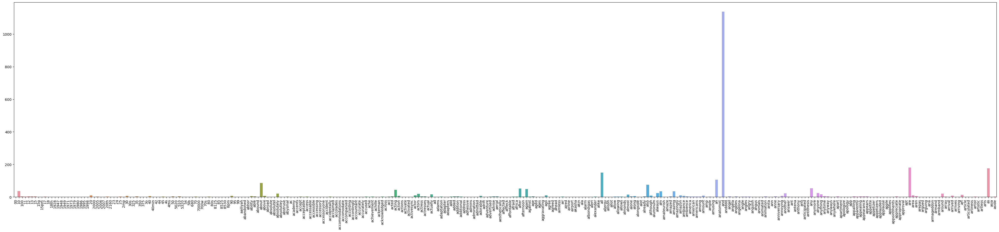

In [411]:
plt.subplots(figsize=(50, 10))
g = sns.barplot(x= df_count_vect.get_feature_names()[:300], 
            y=term_frequencies[:300])
g.set_xticklabels(df_count_vect.get_feature_names()[:300], rotation = 90);

### Exercise 13
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [412]:
import plotly.express as px
fig = px.bar(y=term_frequencies[:300],x= df_count_vect.get_feature_names()[:300],width=800, height=300,labels={'x':'feature names','y':'term frequencies'})
fig.show()

### Exercise 14 (take home):
The chart above contains all the vocabulary, and it's computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 

In [413]:
len(df_count_vect.get_feature_names())

5155

In [414]:
data = {'feature_names': df_count_vect.get_feature_names(),'term_frequencies':term_frequencies}
df_freq = pd.DataFrame(data)
df_freq

,feature_names,term_frequencies
0,00,1
1,10,36
2,100,3
3,11,2
4,12,4
...,...,...
5150,z500a,1
5151,zero,6
5152,zillion,1
5153,zombie,2


#### Answer

In [415]:
df_drop1 = df_freq[df_freq.term_frequencies != 1]
df_drop1
import plotly.express as px
fig = px.bar(x=df_drop1.feature_names[:],y=df_drop1.term_frequencies[:],width=800, height=400,labels={'x':'feature names','y':'term frequencies'})
fig.show()

### Exercise 15
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

#### Answer

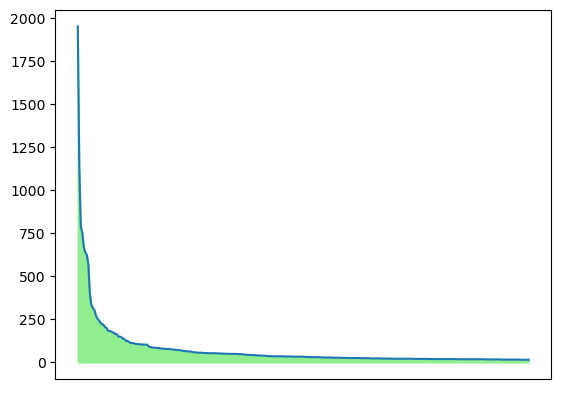

In [416]:
data = {'feature_names': df_count_vect.get_feature_names(),'term_frequencies':term_frequencies}
df_freq = pd.DataFrame(data)
df_freq_sorted = df_freq.sort_values(by=['term_frequencies'],ascending = False)

plt.plot(df_freq_sorted.feature_names[:300],df_freq_sorted.term_frequencies[:300])

plt.fill_between(df_freq_sorted.feature_names[:300],df_freq_sorted.term_frequencies[:300], color = 'lightgreen')
plt.xticks([])
plt.show()

### log distribution visualization

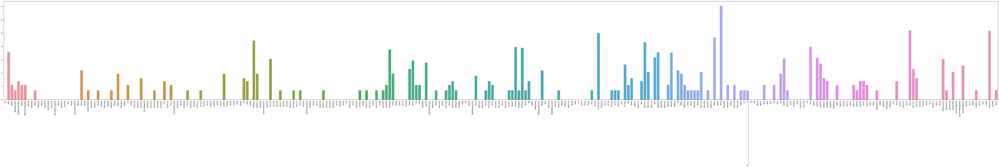

In [417]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names()[:300],
                y=term_frequencies_log[:300])
g.set_xticklabels(count_vect.get_feature_names()[:300], rotation = 90);

### Discretization and Binarization

In [418]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()
mlb.fit(df.company)
print(mlb.classes_)
df['bin_company'] = mlb.transform(df.company).tolist()

[0 1 2]


### Exercise 16
Try to generate the binarization using the `category_name` column instead. Does it work?

In [419]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()

#### Answer

In [420]:
mlb.fit(df.company_name)
df['bin_company_name'] = mlb.transform(df['company_name']).tolist()
df[0:9]

,sentence,score,company_name,company,unigrams,bin_company,bin_company_name
0,Their daily specials are always a hit with my ...,1,yelp,2,"[Their, daily, specials, are, always, a, hit, ...","[0, 0, 1]","[0, 0, 1]"
1,I dressed up to be treated so rudely!,0,yelp,2,"[I, dressed, up, to, be, treated, so, rudely, !]","[0, 0, 1]","[0, 0, 1]"
2,If that bug never showed up I would have given...,0,yelp,2,"[If, that, bug, never, showed, up, I, would, h...","[0, 0, 1]","[0, 0, 1]"
3,T-Mobile has the best customer service anywhere.,1,amazon,0,"[T-Mobile, has, the, best, customer, service, ...","[1, 0, 0]","[1, 0, 0]"
4,By far the BEST cheesecurds we have ever had!,1,yelp,2,"[By, far, the, BEST, cheesecurds, we, have, ev...","[0, 0, 1]","[0, 0, 1]"
5,"This gets a 1 out of 10, simply because there'...",0,imdb,1,"[This, gets, a, 1, out, of, 10, ,, simply, bec...","[0, 1, 0]","[0, 1, 0]"
6,These are the nicest restaurant owners I've ev...,1,yelp,2,"[These, are, the, nicest, restaurant, owners, ...","[0, 0, 1]","[0, 0, 1]"
7,"Their on-screen chemistry, critical to the ent...",1,imdb,1,"[Their, on-screen, chemistry, ,, critical, to,...","[0, 1, 0]","[0, 1, 0]"
8,The voice recognition thru the handset is exce...,1,amazon,0,"[The, voice, recognition, thru, the, handset, ...","[1, 0, 0]","[1, 0, 0]"


## 6. Data Exploration

In [421]:
# We retrieve 2 sentences for a random record, here, indexed at 50 and 100
document_to_transform_1 = []
random_record_1 = df.iloc[50]
random_record_1 = random_record_1['sentence']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = df.iloc[100]
random_record_2 = random_record_2['sentence']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = df.iloc[150]
random_record_3 = random_record_3['sentence']
document_to_transform_3.append(random_record_3)

In [422]:
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['This is such a fun and funny movie.  ']
['Totally different, with loads of understatement and black comedy, this is a film few get to see, but those who do will remember it.  ']
['When I placed my treo into the case, not only was it NOT snug, but there was A LOT of extra room on the sides.']


In [423]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vecors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [424]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})

Cosine Similarity using count bw 1 and 2: 0.241747
Cosine Similarity using count bw 1 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000


---
# Part 3

Please attempt the following tasks on the new dataset. This part is worth 30% of your grade.

## 1. Other Data Visualizations
Generate meaningful new data visualizations. Refer to online resources and the Data Mining textbook for inspiration and ideas.

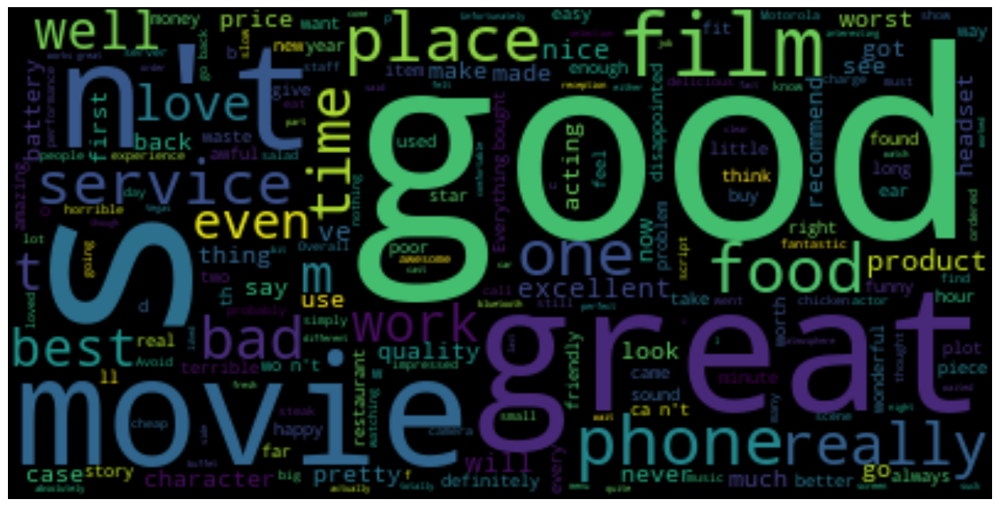

In [444]:
from wordcloud import WordCloud
import nltk
text = ' '.join(nltk.word_tokenize(df.sentence.to_string()))

# Create and Generate a Word Cloud Image
wordcloud = WordCloud().generate(text)

#Display the generated image
plt.figure(figsize=[16,20])
plt.axis('off')
plt.imshow(wordcloud, interpolation="bilinear")

I've plotted the figure above by ```wordcloud``` which could let data analyzer or random people easily identify the which word appeared more frequently and which appeared less.

## 2. TFIDF
Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Sciki-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html).

In [425]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidfvect = TfidfVectorizer()
X_tfidf = tfidfvect.fit_transform(df.sentence)
print(X_tfidf.shape)
print(tfidfvect.get_feature_names()[100:120])

(2983, 5155)
['accomodate', 'accompanied', 'according', 'accordingly', 'accountant', 'accurate', 'accurately', 'accused', 'ache', 'achievement', 'achille', 'ackerman', 'acknowledged', 'across', 'act', 'acted', 'acting', 'action', 'actions', 'activate']


## 3. Naive Bayes
Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).

In [426]:
# store the feature matrix (X) and response vector (y)
X = X_tfidf.toarray()
y = df.score
  
# splitting X and y into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)
  
# training GaussianNB and MultinomialNB model on training set
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB
gnb = GaussianNB()
multi = MultinomialNB()
ber = BernoulliNB()
gnb.fit(X_train, y_train)
multi.fit(X_train, y_train)
ber.fit(X_train, y_train)
# making predictions on the testing set
y_pred_gnb = gnb.predict(X_test)
y_pred_multi = multi.predict(X_test)
y_pred_ber = ber.predict(X_test)

# comparing actual response values (y_test) with predicted response values (y_pred)
from sklearn import metrics
print("Gaussian Naive Bayes model accuracy(in %):  {:.2f}".format(metrics.accuracy_score(y_test, y_pred_gnb)*100))
print("Multinomial Naive Bayes model accuracy(in %):  {:.2f}".format(metrics.accuracy_score(y_test, y_pred_multi)*100))
print("Bernoulli Naive Bayes model accuracy(in %):  {:.2f}".format(metrics.accuracy_score(y_test, y_pred_ber)*100))

Gaussian Naive Bayes model accuracy(in %):  67.17
Multinomial Naive Bayes model accuracy(in %):  80.74
Bernoulli Naive Bayes model accuracy(in %):  81.16


---
# Part 4 : Somethings that are not ideal or the most efficient/meaningful

Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets?

#### Answer
1. Dropping Duplicates

    While doing ```.drop_duplicates(keep = false, inplace = True``` in the lab, I observed that the setting the parameter as ```keep = False``` drops the first data together with the other duplicated data. Hence, for the exercise on the new dataset, I set the parameter as ```keep = 'first'```and improved the accuracy a bit while training Naive Bayes after that.


2. Numbers in Word Frequency

    While plotting different plots of word frequency, we can see that some high bars lie on words such as '000', '0930' or other strings of numbers. We might want to drop those numbers to increase the symbolic of other strings.
    
    
3. Didn't Remove Stopwords
    
    Through observing the word frequency plots, we can also see that many frequent words were stopwords. Hence, we might want to remove stopwords during tokenizing or calculating word frequency.